# TLT DetectNet_v2 tutorial en Riesgo Encubierto  

Se implementó siguiendo [este](https://www.youtube.com/watch?v=5SA809OKtdQ ) tutorial.  
Este Notebook debe ejecutarse dentro de la máquina Oracle que tiene una GPU V100.  

>docker run --gpus all -it -v /home/ubuntu/riesgo-encubierto:/workspace/riesgo-encubierto/ -p   >8888:8888 nvcr.io/nvidia/tlt-streamanalytics:v2.0_py3 /bin/bash  
>ngc config set *# No sé si toca volver a hacer esto...*  
>jupyter notebook --ip 0.0.0.0 --port 8888 --allow-root  
>http://193.122.206.53:8888/ *# Cada vez con la nueva IP*  

## 0. Set up env variables <a class="anchor" id="head-0"></a>
When using the purpose-built pretrained models from NGC, please make sure to set the `$KEY` environment variable to the key as mentioned in the model overview. Failing to do so, can lead to errors when trying to load them as pretrained models.

*Note: Please make sure to remove any stray artifacts/files from the `$USER_EXPERIMENT_DIR` or `$DATA_DOWNLOAD_DIR` paths as mentioned below, that may have been generated from previous experiments. Having checkpoint files etc may interfere with creating a training graph for a new experiment.*

*Note: This notebook currently is by default set up to run training using 1 GPU. To use more GPU's please update the env variable `$NUM_GPUS` accordingly*

In [1]:
# Setting up env variables for cleaner command line commands.
# Aqui cambié DATA_DOWNLOAD_DIR por DATA_DIR y pasar las imágenes y labels y Oracle
# No le puedo apuntar a mis carpetas separadas, pues están local, no en oracle en la conectada al docker
%env KEY=MTJucXRvdWlma2QwZmJoYnVwOGpvYjNzczA6YzUzNmE1MGMtNjVlNS00OWEyLTlkN2UtZjZlYTFiYWViZTFk
%env USER_EXPERIMENT_DIR=/workspace/riesgo-encubierto/detectnet_v2
%env DATA_DIR=/workspace/riesgo-encubierto/data
%env SPECS_DIR=/workspace/riesgo-encubierto/specs
%env NUM_GPUS=1

env: KEY=MTJucXRvdWlma2QwZmJoYnVwOGpvYjNzczA6YzUzNmE1MGMtNjVlNS00OWEyLTlkN2UtZjZlYTFiYWViZTFk
env: USER_EXPERIMENT_DIR=/workspace/riesgo-encubierto/detectnet_v2
env: DATA_DIR=/workspace/riesgo-encubierto/data
env: SPECS_DIR=/workspace/riesgo-encubierto/specs
env: NUM_GPUS=1


## 1. Prepare dataset and pre-trained model <a class="anchor" id="head-1"></a>

### A. Verify downloaded dataset <a class="anchor" id="head-1-1"></a>

In [2]:
# verify
import os

DATA_DIR = os.environ.get('DATA_DIR')
num_training_images = len(os.listdir(os.path.join(DATA_DIR, "training/image")))
num_training_labels = len(os.listdir(os.path.join(DATA_DIR, "training/label")))
num_testing_images = len(os.listdir(os.path.join(DATA_DIR, "testing/image")))
print("Number of images in the trainval set. {}".format(num_training_images))
print("Number of labels in the trainval set. {}".format(num_training_labels))
print("Number of images in the test set. {}".format(num_testing_images))

Number of images in the trainval set. 2967
Number of labels in the trainval set. 2967
Number of images in the test set. 0


In [3]:
# Sample kitti label.
!cat $DATA_DIR/training/label/EPP_3500.txt

### B. Prepare tf records from kitti format dataset <a class="anchor" id="head-1-2"></a>

* Update the tfrecords spec file to take in your kitti format dataset
* Create the tfrecords using the tlt-dataset-convert 

*Note: TfRecords only need to be generated once.*

In [4]:
# Este es todo el archivo de configuración. Solo hay que ajustar: rutas de imagenes/labels y extensión
print("TFrecords conversion spec file for kitti training")
!cat $SPECS_DIR/detectnet_v2_tfrecords_kitti_trainval.txt

TFrecords conversion spec file for kitti training
kitti_config {
  root_directory_path: "/workspace/riesgo-encubierto/data/training"
  image_dir_name: "image"
  label_dir_name: "label"
  image_extension: ".jpg"
  partition_mode: "random"
  num_partitions: 2
  val_split: 14
  num_shards: 10
}
image_directory_path: "/workspace/riesgo-encubierto/data/training"


In [5]:
# Creating a new directory for the output tfrecords dump.
# Con solo lo que le indico en el archivo anterior, crea una carpeta TFrecords dentro de /data
print("Converting Tfrecords for kitti trainval dataset")
!tlt-dataset-convert -d $SPECS_DIR/detectnet_v2_tfrecords_kitti_trainval.txt \
                     -o $DATA_DIR/tfrecords/kitti_trainval/kitti_trainval

Converting Tfrecords for kitti trainval dataset
2021-09-13 01:27:40.101486: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
Using TensorFlow backend.
2021-09-13 01:27:48,016 - iva.detectnet_v2.dataio.build_converter - INFO - Instantiating a kitti converter
2021-09-13 01:27:48,016 - iva.detectnet_v2.dataio.dataset_converter_lib - INFO - Creating output directory /workspace/riesgo-encubierto/data/tfrecords/kitti_trainval
2021-09-13 01:27:48,034 - iva.detectnet_v2.dataio.kitti_converter_lib - INFO - Num images in
Train: 2552	Val: 415
2021-09-13 01:27:48,034 - iva.detectnet_v2.dataio.kitti_converter_lib - INFO - Validation data in partition 0. Hence, while choosing the validationset during training choose validation_fold 0.
2021-09-13 01:27:48,038 - iva.detectnet_v2.dataio.dataset_converter_lib - INFO - Writing partition 0, shard 0

2021-09-13 01:27:48,039 - tensorflow - WARNING - From /home/vpraveen/.cache/dazel/_dazel_

In [6]:
!ls -rlt $DATA_DIR/tfrecords/kitti_trainval/

total 2300
-rw-r--r-- 1 root root  30769 Sep 13 01:27 kitti_trainval-fold-000-of-002-shard-00000-of-00010
-rw-r--r-- 1 root root  32447 Sep 13 01:27 kitti_trainval-fold-000-of-002-shard-00001-of-00010
-rw-r--r-- 1 root root  32215 Sep 13 01:27 kitti_trainval-fold-000-of-002-shard-00002-of-00010
-rw-r--r-- 1 root root  32130 Sep 13 01:27 kitti_trainval-fold-000-of-002-shard-00003-of-00010
-rw-r--r-- 1 root root  30807 Sep 13 01:27 kitti_trainval-fold-000-of-002-shard-00004-of-00010
-rw-r--r-- 1 root root  30982 Sep 13 01:27 kitti_trainval-fold-000-of-002-shard-00005-of-00010
-rw-r--r-- 1 root root  33427 Sep 13 01:27 kitti_trainval-fold-000-of-002-shard-00006-of-00010
-rw-r--r-- 1 root root  29876 Sep 13 01:27 kitti_trainval-fold-000-of-002-shard-00007-of-00010
-rw-r--r-- 1 root root  30200 Sep 13 01:27 kitti_trainval-fold-000-of-002-shard-00008-of-00010
-rw-r--r-- 1 root root  35154 Sep 13 01:27 kitti_trainval-fold-000-of-002-shard-00009-of-00010
-rw-r--r-- 1 root root 195768 Sep 13 01

### C. Download pre-trained model <a class="anchor" id="head-1-3"></a>
Download the correct pretrained model from the NGC model registry for your experiment. Please note that for DetectNet_v2, the input is expected to be 0-1 normalized with input channels in RGB order. Therefore, for optimum results please download model templates from `nvidia/tlt_pretrained_detectnet_v2`. The templates are now organizede as version strings. For example, to download a resnet18 model suitable for detectnet please resolve to the ngc object shown as `nvidia/tlt_pretrained_detectnet_v2:resnet18`. 

All other models expect input preprocessing with mean subtraction and input channels in BGR order. Thus, using them as pretrained weights may result in suboptimal performance. 

In [7]:
# List models available in the model registry.
!ngc registry model list nvidia/tlt_pretrained_detectnet_v2:*

+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| Versi | Accur | Epoch | Batch | GPU   | Memor | File  | Statu | Creat |
| on    | acy   | s     | Size  | Model | y Foo | Size  | s     | ed    |
|       |       |       |       |       | tprin |       |       | Date  |
|       |       |       |       |       | t     |       |       |       |
+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| vgg19 | 82.6  | 80    | 1     | V100  | 153.8 | 153.7 | UPLOA | Apr   |
|       |       |       |       |       |       | 7 MB  | D_COM | 29,   |
|       |       |       |       |       |       |       | PLETE | 2020  |
| vgg16 | 82.2  | 80    | 1     | V100  | 113.2 | 113.2 | UPLOA | Apr   |
|       |       |       |       |       |       | MB    | D_COM | 29,   |
|       |       |       |       |       |       |       | PLETE | 2020  |
| squee | 65.67 | 80    | 1     | V100  | 6.5   | 6.46  | UPLOA | Apr   |
| zenet |       |       |       |     

In [8]:
# Create the target destination to download the model.
!mkdir -p $USER_EXPERIMENT_DIR/pretrained_resnet10/

In [9]:
# Download the pretrained model from NGC
!ngc registry model download-version nvidia/tlt_pretrained_detectnet_v2:resnet10 \
    --dest $USER_EXPERIMENT_DIR/pretrained_resnet10

Downloaded 35.47 MB in 4s, Download speed: 8.85 MB/s                
----------------------------------------------------
Transfer id: tlt_pretrained_detectnet_v2_vresnet10 Download status: Completed.
Downloaded local path: /workspace/riesgo-encubierto/detectnet_v2/pretrained_resnet10/tlt_pretrained_detectnet_v2_vresnet10
Total files downloaded: 1 
Total downloaded size: 35.47 MB
Started at: 2021-09-13 01:28:45.885271
Completed at: 2021-09-13 01:28:49.891239
Duration taken: 4s
----------------------------------------------------


In [10]:
!ls -rlt $USER_EXPERIMENT_DIR/pretrained_resnet10/tlt_pretrained_detectnet_v2_vresnet10

total 39264
-rw------- 1 root root 40205392 Sep 13 01:28 resnet10.hdf5


## 2. Provide training specification <a class="anchor" id="head-2"></a>
* Tfrecords for the train datasets
    * In order to use the newly generated tfrecords, update the dataset_config parameter in the spec file at `$SPECS_DIR/detectnet_v2_train_resnet18_kitti.txt` 
    * Update the fold number to use for evaluation. In case of random data split, please use fold `0` only
    * For sequence-wise split, you may use any fold generated from the dataset convert tool
* Pre-trained models
* Augmentation parameters for on the fly data augmentation
* Other training (hyper-)parameters such as batch size, number of epochs, learning rate etc.

In [12]:
# Basarse en el resnet18 y crear uno nuevo. Solo se cambia extension, clases, model_config, num_layers
# Hiperparam: training_config: epochs y BS
!cat $SPECS_DIR/detectnet_v2_train_resnet10_kitti_alertas_w.txt

random_seed: 42
dataset_config {
  data_sources {
    tfrecords_path: "/workspace/riesgo-encubierto/data/tfrecords/kitti_trainval/*"
    image_directory_path: "/workspace/riesgo-encubierto/data/training"
  }
  image_extension: "jpg"
  target_class_mapping {
    key: "pies_sin_proteccion"
    value: "pies_sin_proteccion"
  }
  target_class_mapping {
    key: "cabeza_sin_proteccion"
    value: "cabeza_sin_proteccion"
  }
  target_class_mapping {
    key: "ojos_sin_proteccion"
    value: "ojos_sin_proteccion"
  }
  target_class_mapping {
    key: "boca_sin_proteccion"
    value: "boca_sin_proteccion"
  }
  validation_fold: 0
}
augmentation_config {
  preprocessing {
    output_image_width: 960
    output_image_height: 544
    min_bbox_width: 1.0
    min_bbox_height: 1.0
    output_image_channel: 3
  }
  spatial_augmentation {
    hflip_probability: 0.5
    zoom_min: 1.0
    zoom_max: 1.0
    translate_max_x: 8.0
    translate_max_y: 8.0
    rotate_rad_max : 0.0
  }
  color_augmentation {


## 3. Run TLT training <a class="anchor" id="head-3"></a>
* Provide the sample spec file and the output directory location for models

*Note: The training may take hours to complete. Also, the remaining notebook, assumes that the training was done in single-GPU mode. When run in multi-GPU mode, please expect to update the pruning and inference steps with new pruning thresholds and updated parameters in the clusterfile.json accordingly for optimum performance.*

*Detectnet_v2 now supports restart from checkpoint. Incase, the training job is killed prematurely, you may resume training from the closest checkpoint by simply re-running the **same** command line. Please do make sure to use the <u>**same number of GPUs**</u> when restarting the training.*

*When running the training with NUM_GPUs>1, you may need to modify the `batc_size_per_gpu` and `learning_rate` to get similar mAP as a 1GPU training run. In most cases, scaling down the batch-size by a factor of NUM_GPU's or scaling up the learning rate by a factor of NUM_GPU's would be a good place to start.* 

In [13]:
# Este sirve para UNA GPU
# Crea la carpeta experiment_dir_unpruned y ahí va poniendo weights y checkpoints (Borrar para reejecutar!)
# Se demora 20 min
!tlt-train detectnet_v2 -e $SPECS_DIR/detectnet_v2_train_resnet10_kitti_alertas_w.txt \
                        -r $USER_EXPERIMENT_DIR/experiment_dir_unpruned \
                        -k $KEY \
                        -n resnet10_detector \
                        --gpus $NUM_GPUS

Using TensorFlow backend.
2021-09-13 01:35:10.708103: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
--------------------------------------------------------------------------
[[48191,1],0]: A high-performance Open MPI point-to-point messaging module
was unable to find any relevant network interfaces:

Module: OpenFabrics (openib)
  Host: 1d7cf22a659a

Another transport will be used instead, although this may result in
lower performance.

NOTE: You can disable this warning by setting the MCA parameter
btl_base_warn_component_unused to 0.
--------------------------------------------------------------------------
2021-09-13 01:35:16.036004: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-09-13 01:35:16.083327: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be a

2021-09-13 01:35:29,247 [INFO] iva.detectnet_v2.dataloader.default_dataloader: Bounding box coordinates were detected in the input specification! Bboxes will be automatically converted to polygon coordinates.
2021-09-13 01:35:29.301036: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-13 01:35:29.301866: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:04.0
2021-09-13 01:35:29.301927: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 01:35:29.301991: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2021-09-13 01:35:29.302040: I tensorflow/stream_executor/platform/

2021-09-13 01:36:12,438 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.909
2021-09-13 01:36:17,254 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 20.767
2021-09-13 01:36:18,636 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.394
2021-09-13 01:36:20,012 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.664
2021-09-13 01:36:21,389 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.653
2021-09-13 01:36:22,770 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.443
2021-09-13 01:36:24,164 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.718
2021-09-13 01:36:25,521 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.751
2021-09-13 01:36:26,899 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.583
2021-09-13 01:36:28,296 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.591
2021-09-13 01:36:29,658 [INFO] modulus.hooks.sample_counter_

2021-09-13 01:38:08,964 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.711
2021-09-13 01:38:10,343 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.559
2021-09-13 01:38:11,729 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.134
2021-09-13 01:38:13,106 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.645
2021-09-13 01:38:14,485 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.569
2021-09-13 01:38:15,838 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.901
2021-09-13 01:38:17,218 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.506
2021-09-13 01:38:18,578 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.542
2021-09-13 01:38:19,950 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.888
2021-09-13 01:38:21,314 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.382
2021-09-13 01:38:22,694 [INFO] modulus.hooks.sample_counter_

2021-09-13 01:40:01,738 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.126
2021-09-13 01:40:03,104 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.198
2021-09-13 01:40:04,463 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.601
2021-09-13 01:40:05,846 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.365
2021-09-13 01:40:07,217 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.986
2021-09-13 01:40:08,585 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.076
2021-09-13 01:40:09,972 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.138
2021-09-13 01:40:11,346 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.783
2021-09-13 01:40:12,737 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.923
2021-09-13 01:40:14,107 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.014
2021-09-13 01:40:15,463 [INFO] modulus.hooks.sample_counter_

2021-09-13 01:41:54,490 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.047
2021-09-13 01:41:55,873 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.317
2021-09-13 01:41:57,267 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.741
2021-09-13 01:41:58,625 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.668
2021-09-13 01:41:59,996 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.945
2021-09-13 01:42:01,346 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.112
2021-09-13 01:42:02,703 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.732
2021-09-13 01:42:04,077 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.793
2021-09-13 01:42:07,312 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 10/100: loss: 0.00028 Time taken: 0:00:38.041199 ETA: 0:57:03.707886
2021-09-13 01:42:08,362 [INFO] modulus.hooks.sample_count

2021-09-13 01:43:50,028 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.065
2021-09-13 01:43:51,398 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.008
2021-09-13 01:43:52,509 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 13/100: loss: 0.00021 Time taken: 0:00:35.039412 ETA: 0:50:48.428804
2021-09-13 01:43:52,795 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.616
2021-09-13 01:43:54,162 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.147
2021-09-13 01:43:55,543 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.464
2021-09-13 01:43:56,913 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.013
2021-09-13 01:43:58,290 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.637
2021-09-13 01:43:59,671 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.437
2021-09-13 01:44:01,031 [INFO] modulus.hooks.sample_count

2021-09-13 01:45:39,929 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.907
2021-09-13 01:45:41,292 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.355
2021-09-13 01:45:42,639 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.286
2021-09-13 01:45:44,003 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.343
2021-09-13 01:45:45,411 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.029
2021-09-13 01:45:46,810 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.505
2021-09-13 01:45:48,171 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.517
2021-09-13 01:45:49,540 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.023
2021-09-13 01:45:50,895 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.854
2021-09-13 01:45:52,251 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.755
2021-09-13 01:45:53,615 [INFO] modulus.hooks.sample_counter_

2021-09-13 01:47:32,538 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.304
2021-09-13 01:47:33,890 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.982
2021-09-13 01:47:35,254 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.322
2021-09-13 01:47:36,656 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.365
2021-09-13 01:47:38,039 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.327
2021-09-13 01:47:39,420 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.437
2021-09-13 01:47:40,771 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.039
2021-09-13 01:47:42,147 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.663
2021-09-13 01:47:43,516 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.088
2021-09-13 01:47:44,887 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.974
2021-09-13 01:47:46,273 [INFO] modulus.hooks.sample_counter_

2021-09-13 01:49:13,830 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.749
2021-09-13 01:49:15,218 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.098
2021-09-13 01:49:16,604 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.151
2021-09-13 01:49:17,975 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.979
2021-09-13 01:49:19,353 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.584
2021-09-13 01:49:20,733 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.495
2021-09-13 01:49:21,420 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 22/100: loss: 0.00008 Time taken: 0:00:35.135680 ETA: 0:45:40.583055
2021-09-13 01:49:22,136 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.289
2021-09-13 01:49:23,534 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.543
2021-09-13 01:49:24,909 [INFO] modulus.hooks.sample_count

2021-09-13 01:51:06,743 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.284
2021-09-13 01:51:06,805 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 25/100: loss: 0.00007 Time taken: 0:00:35.050137 ETA: 0:43:48.760278
2021-09-13 01:51:08,129 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.277
2021-09-13 01:51:09,481 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.967
2021-09-13 01:51:10,865 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.307
2021-09-13 01:51:12,239 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.792
2021-09-13 01:51:13,621 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.373
2021-09-13 01:51:15,000 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.522
2021-09-13 01:51:16,389 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.027
2021-09-13 01:51:17,770 [INFO] modulus.hooks.sample_count

2021-09-13 01:52:56,892 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.540
2021-09-13 01:52:58,257 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.276
2021-09-13 01:52:59,606 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.144
2021-09-13 01:53:00,973 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.155
2021-09-13 01:53:02,342 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.060
2021-09-13 01:53:03,707 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.288
2021-09-13 01:53:05,079 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.940
2021-09-13 01:53:06,437 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.613
2021-09-13 01:53:07,818 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.464
2021-09-13 01:53:09,198 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.500
2021-09-13 01:53:10,577 [INFO] modulus.hooks.sample_counter_

2021-09-13 01:54:38,355 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.058
2021-09-13 01:54:39,719 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.328
2021-09-13 01:54:41,100 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.446
2021-09-13 01:54:42,482 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.354
2021-09-13 01:54:43,897 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 70.704
2021-09-13 01:54:45,311 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 70.753
2021-09-13 01:54:46,721 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 70.935
2021-09-13 01:54:48,131 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 70.978
2021-09-13 01:54:49,576 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 69.222
2021-09-13 01:54:50,990 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 70.732
2021-09-13 01:54:52,416 [INFO] modulus.hooks.sample_counter_

2021-09-13 01:56:31,492 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.564
2021-09-13 01:56:32,873 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.419
2021-09-13 01:56:34,262 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.051
2021-09-13 01:56:35,640 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.552
2021-09-13 01:56:37,034 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.802
2021-09-13 01:56:38,019 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 34/100: loss: 0.00008 Time taken: 0:00:35.133863 ETA: 0:38:38.834956
2021-09-13 01:56:38,399 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.282
2021-09-13 01:56:39,750 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.021
2021-09-13 01:56:41,169 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 70.469
2021-09-13 01:56:42,553 [INFO] modulus.hooks.sample_count

2021-09-13 01:58:23,339 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 37/100: loss: 0.00005 Time taken: 0:00:35.083059 ETA: 0:36:50.232692
2021-09-13 01:58:24,353 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.076
2021-09-13 01:58:25,747 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.763
2021-09-13 01:58:27,188 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 69.425
2021-09-13 01:58:28,641 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 68.816
2021-09-13 01:58:30,059 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 70.552
2021-09-13 01:58:31,503 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 69.305
2021-09-13 01:58:32,969 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 68.240
2021-09-13 01:58:34,426 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 68.630
2021-09-13 01:58:35,852 [INFO] modulus.hooks.sample_count

2021-09-13 02:00:15,604 [INFO] iva.detectnet_v2.evaluation.evaluation: step 50 / 103, 0.07s/step
2021-09-13 02:00:16,255 [INFO] iva.detectnet_v2.evaluation.evaluation: step 60 / 103, 0.07s/step
2021-09-13 02:00:16,872 [INFO] iva.detectnet_v2.evaluation.evaluation: step 70 / 103, 0.06s/step
2021-09-13 02:00:17,484 [INFO] iva.detectnet_v2.evaluation.evaluation: step 80 / 103, 0.06s/step
2021-09-13 02:00:18,108 [INFO] iva.detectnet_v2.evaluation.evaluation: step 90 / 103, 0.06s/step
2021-09-13 02:00:18,781 [INFO] iva.detectnet_v2.evaluation.evaluation: step 100 / 103, 0.07s/step
Matching predictions to ground truth, class 4/4.: 100%|█| 2118/2118 [00:00<00:00, 11317.79it/s]
Epoch 40/100

Validation cost: 0.000042
Mean average_precision (in %): 51.3266

class name               average precision (in %)
---------------------  --------------------------
boca_sin_proteccion                       61.3849
cabeza_sin_proteccion                     63.7135
ojos_sin_proteccion                      

2021-09-13 02:01:52,294 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.376
2021-09-13 02:01:53,669 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.737
2021-09-13 02:01:55,018 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.144
2021-09-13 02:01:56,383 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.287
2021-09-13 02:01:57,745 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.467
2021-09-13 02:01:59,110 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.296
2021-09-13 02:02:00,461 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.040
2021-09-13 02:02:01,834 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.855
2021-09-13 02:02:03,223 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.018
2021-09-13 02:02:04,594 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.927
2021-09-13 02:02:05,150 [INFO] /usr/local/lib/python3.6/dist

2021-09-13 02:03:44,941 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.578
2021-09-13 02:03:46,310 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.055
2021-09-13 02:03:47,691 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.448
2021-09-13 02:03:49,065 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.811
2021-09-13 02:03:50,375 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 46/100: loss: 0.00008 Time taken: 0:00:35.142272 ETA: 0:31:37.682701
2021-09-13 02:03:50,429 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.338
2021-09-13 02:03:51,805 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.669
2021-09-13 02:03:53,177 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.920
2021-09-13 02:03:54,546 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.059
2021-09-13 02:03:55,923 [INFO] modulus.hooks.sample_count

2021-09-13 02:05:36,203 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.711
2021-09-13 02:05:37,597 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.757
2021-09-13 02:05:38,972 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.740
2021-09-13 02:05:40,348 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.679
2021-09-13 02:05:41,729 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.452
2021-09-13 02:05:43,099 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.037
2021-09-13 02:05:44,466 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.152
2021-09-13 02:05:45,846 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.470
2021-09-13 02:05:47,242 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.650
2021-09-13 02:05:48,631 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.011
2021-09-13 02:05:50,005 [INFO] modulus.hooks.sample_counter_

2021-09-13 02:07:16,435 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 70.705
2021-09-13 02:07:17,815 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.487
2021-09-13 02:07:19,189 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.794
2021-09-13 02:07:20,564 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.725
2021-09-13 02:07:21,947 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.362
2021-09-13 02:07:23,330 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.339
2021-09-13 02:07:24,705 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.745
2021-09-13 02:07:26,068 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.404
2021-09-13 02:07:27,444 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.672
2021-09-13 02:07:28,824 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.484
2021-09-13 02:07:30,183 [INFO] modulus.hooks.sample_counter_

2021-09-13 02:09:09,149 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.318
2021-09-13 02:09:10,520 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.951
2021-09-13 02:09:11,891 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.934
2021-09-13 02:09:13,274 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.347
2021-09-13 02:09:14,619 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.359
2021-09-13 02:09:15,999 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.492
2021-09-13 02:09:17,359 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.560
2021-09-13 02:09:18,242 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 55/100: loss: 0.00007 Time taken: 0:00:34.980615 ETA: 0:26:14.127681
2021-09-13 02:09:18,738 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.505
2021-09-13 02:09:20,116 [INFO] modulus.hooks.sample_count

2021-09-13 02:11:02,055 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.756
2021-09-13 02:11:03,420 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.260
2021-09-13 02:11:03,704 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 58/100: loss: 0.00007 Time taken: 0:00:35.096122 ETA: 0:24:34.037115
2021-09-13 02:11:04,801 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.457
2021-09-13 02:11:06,167 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.235
2021-09-13 02:11:07,559 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.838
2021-09-13 02:11:08,945 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.178
2021-09-13 02:11:10,324 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.523
2021-09-13 02:11:11,710 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.184
2021-09-13 02:11:13,061 [INFO] modulus.hooks.sample_count

2021-09-13 02:12:36,589 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.879
2021-09-13 02:12:37,971 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.385
2021-09-13 02:12:39,357 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.185
2021-09-13 02:12:40,732 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.748
2021-09-13 02:12:42,123 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.905
2021-09-13 02:12:43,492 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.103
2021-09-13 02:12:44,863 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.944
2021-09-13 02:12:46,234 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.931
2021-09-13 02:12:47,618 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.296
2021-09-13 02:12:48,996 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.577
2021-09-13 02:12:50,372 [INFO] modulus.hooks.sample_counter_

2021-09-13 02:14:29,243 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.771
2021-09-13 02:14:30,596 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.949
2021-09-13 02:14:31,989 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.819
2021-09-13 02:14:33,380 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.923
2021-09-13 02:14:34,741 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.459
2021-09-13 02:14:36,110 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.077
2021-09-13 02:14:37,478 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.111
2021-09-13 02:14:38,843 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.334
2021-09-13 02:14:40,232 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.973
2021-09-13 02:14:41,588 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.778
2021-09-13 02:14:42,968 [INFO] modulus.hooks.sample_counter_

2021-09-13 02:16:21,963 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.536
2021-09-13 02:16:23,331 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.159
2021-09-13 02:16:24,706 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.742
2021-09-13 02:16:26,082 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.669
2021-09-13 02:16:27,479 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.641
2021-09-13 02:16:28,703 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 67/100: loss: 0.00004 Time taken: 0:00:35.083955 ETA: 0:19:17.770509
2021-09-13 02:16:28,870 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.912
2021-09-13 02:16:30,244 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.771
2021-09-13 02:16:31,625 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.457
2021-09-13 02:16:32,985 [INFO] modulus.hooks.sample_count

2021-09-13 02:18:16,739 [INFO] iva.detectnet_v2.evaluation.evaluation: step 0 / 103, 0.00s/step
2021-09-13 02:18:17,334 [INFO] iva.detectnet_v2.evaluation.evaluation: step 10 / 103, 0.06s/step
2021-09-13 02:18:17,944 [INFO] iva.detectnet_v2.evaluation.evaluation: step 20 / 103, 0.06s/step
2021-09-13 02:18:18,555 [INFO] iva.detectnet_v2.evaluation.evaluation: step 30 / 103, 0.06s/step
2021-09-13 02:18:19,229 [INFO] iva.detectnet_v2.evaluation.evaluation: step 40 / 103, 0.07s/step
2021-09-13 02:18:19,831 [INFO] iva.detectnet_v2.evaluation.evaluation: step 50 / 103, 0.06s/step
2021-09-13 02:18:20,459 [INFO] iva.detectnet_v2.evaluation.evaluation: step 60 / 103, 0.06s/step
2021-09-13 02:18:21,060 [INFO] iva.detectnet_v2.evaluation.evaluation: step 70 / 103, 0.06s/step
2021-09-13 02:18:21,628 [INFO] iva.detectnet_v2.evaluation.evaluation: step 80 / 103, 0.06s/step
2021-09-13 02:18:22,256 [INFO] iva.detectnet_v2.evaluation.evaluation: step 90 / 103, 0.06s/step
2021-09-13 02:18:22,856 [INFO] 

2021-09-13 02:19:48,418 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.055
2021-09-13 02:19:49,795 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.680
2021-09-13 02:19:51,150 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.827
2021-09-13 02:19:52,520 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.985
2021-09-13 02:19:53,922 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.331
2021-09-13 02:19:55,312 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.964
2021-09-13 02:19:56,696 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.314
2021-09-13 02:19:58,067 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.922
2021-09-13 02:19:59,432 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.327
2021-09-13 02:20:00,807 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.726
2021-09-13 02:20:02,185 [INFO] modulus.hooks.sample_counter_

2021-09-13 02:21:41,677 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.366
2021-09-13 02:21:43,063 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.202
2021-09-13 02:21:44,413 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.063
2021-09-13 02:21:45,784 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.965
2021-09-13 02:21:47,158 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.836
2021-09-13 02:21:48,545 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.089
2021-09-13 02:21:49,921 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.718
2021-09-13 02:21:51,309 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.064
2021-09-13 02:21:52,695 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.206
2021-09-13 02:21:54,085 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.971
2021-09-13 02:21:54,862 [INFO] /usr/local/lib/python3.6/dist

2021-09-13 02:23:34,608 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.892
2021-09-13 02:23:35,976 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.132
2021-09-13 02:23:37,380 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.210
2021-09-13 02:23:38,765 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.236
2021-09-13 02:23:40,135 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.035
2021-09-13 02:23:40,310 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 79/100: loss: 0.00008 Time taken: 0:00:35.117356 ETA: 0:12:17.464482
2021-09-13 02:23:41,509 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.813
2021-09-13 02:23:42,873 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.289
2021-09-13 02:23:44,260 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.158
2021-09-13 02:23:45,649 [INFO] modulus.hooks.sample_count

2021-09-13 02:25:09,564 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.302
2021-09-13 02:25:10,938 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.817
2021-09-13 02:25:12,307 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.098
2021-09-13 02:25:13,681 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.826
2021-09-13 02:25:15,052 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.919
2021-09-13 02:25:16,435 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.323
2021-09-13 02:25:17,816 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.461
2021-09-13 02:25:19,185 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.071
2021-09-13 02:25:20,550 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.246
2021-09-13 02:25:21,902 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.987
2021-09-13 02:25:23,284 [INFO] modulus.hooks.sample_counter_

2021-09-13 02:27:02,133 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.598
2021-09-13 02:27:03,499 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.232
2021-09-13 02:27:04,877 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.593
2021-09-13 02:27:06,262 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.253
2021-09-13 02:27:07,633 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.941
2021-09-13 02:27:09,002 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.066
2021-09-13 02:27:10,354 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.983
2021-09-13 02:27:11,722 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.141
2021-09-13 02:27:13,079 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.706
2021-09-13 02:27:14,436 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.738
2021-09-13 02:27:15,789 [INFO] modulus.hooks.sample_counter_

2021-09-13 02:28:54,775 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.881
2021-09-13 02:28:56,160 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.268
2021-09-13 02:28:57,542 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.346
2021-09-13 02:28:58,926 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.283
2021-09-13 02:29:00,310 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.278
2021-09-13 02:29:01,687 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.668
2021-09-13 02:29:03,081 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.739
2021-09-13 02:29:04,453 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.877
2021-09-13 02:29:05,547 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 88/100: loss: 0.00003 Time taken: 0:00:35.160401 ETA: 0:07:01.924810
2021-09-13 02:29:05,820 [INFO] modulus.hooks.sample_count

2021-09-13 02:30:29,766 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.807
2021-09-13 02:30:31,139 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.831
2021-09-13 02:30:32,518 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.555
2021-09-13 02:30:33,892 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.809
2021-09-13 02:30:35,254 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.449
2021-09-13 02:30:36,630 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.680
2021-09-13 02:30:38,004 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.798
2021-09-13 02:30:39,380 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.715
2021-09-13 02:30:40,735 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.835
2021-09-13 02:30:42,127 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.828
2021-09-13 02:30:43,495 [INFO] modulus.hooks.sample_counter_

2021-09-13 02:32:22,367 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.793
2021-09-13 02:32:23,742 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.746
2021-09-13 02:32:25,131 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.989
2021-09-13 02:32:26,523 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.867
2021-09-13 02:32:27,902 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.527
2021-09-13 02:32:29,282 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.505
2021-09-13 02:32:30,662 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.455
2021-09-13 02:32:32,040 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.600
2021-09-13 02:32:33,456 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 70.688
2021-09-13 02:32:34,842 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.136
2021-09-13 02:32:36,208 [INFO] modulus.hooks.sample_counter_

2021-09-13 02:34:15,254 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.214
2021-09-13 02:34:16,606 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.005
2021-09-13 02:34:17,959 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.900
2021-09-13 02:34:19,363 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.256
2021-09-13 02:34:20,742 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.564
2021-09-13 02:34:22,110 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.105
2021-09-13 02:34:23,481 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.965
2021-09-13 02:34:24,871 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 71.961
2021-09-13 02:34:26,220 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 74.157
2021-09-13 02:34:27,597 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.613
2021-09-13 02:34:28,976 [INFO] modulus.hooks.sample_counter_

2021-09-13 02:36:07,989 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.142
2021-09-13 02:36:09,374 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 72.214
2021-09-13 02:36:10,726 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.992
2021-09-13 02:36:12,085 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.621
2021-09-13 02:36:13,452 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.148
2021-09-13 02:36:14,821 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 73.103
2021-09-13 02:36:19,081 [INFO] iva.detectnet_v2.evaluation.evaluation: step 0 / 103, 0.00s/step
2021-09-13 02:36:19,669 [INFO] iva.detectnet_v2.evaluation.evaluation: step 10 / 103, 0.06s/step
2021-09-13 02:36:20,249 [INFO] iva.detectnet_v2.evaluation.evaluation: step 20 / 103, 0.06s/step
2021-09-13 02:36:20,801 [INFO] iva.detectnet_v2.evaluation.evaluation: step 30 / 103, 0.06s/step
2021-09-13 02:36:21,425 [INFO] iva.detectnet_v2.e

In [14]:
print('Model for each epoch:')
print('---------------------')
!ls -lh $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights

Model for each epoch:
---------------------
total 19M
-rw-r--r-- 1 root root 19M Sep 13 02:36 resnet10_detector.tlt


## 4. Evaluate the trained model <a class="anchor" id="head-4"></a>

In [16]:
# Vuelve y muestra la estructura de la red y los resultados para c/clase (No se demora)
!tlt-evaluate detectnet_v2 -e $SPECS_DIR/detectnet_v2_train_resnet10_kitti_alertas_w.txt\
                           -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/resnet10_detector.tlt \
                           -k $KEY

Using TensorFlow backend.
2021-09-13 02:37:48.828599: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 02:37:53,008 [INFO] iva.detectnet_v2.spec_handler.spec_loader: Merging specification from /workspace/riesgo-encubierto/specs/detectnet_v2_train_resnet10_kitti_alertas_w.txt
2021-09-13 02:37:54.393186: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-09-13 02:37:54.456609: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-13 02:37:54.457438: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:04.0
2021-09-13 02:37:54.457495: I tensorflow/stream_executor/platform/defa

2021-09-13 02:37:59.711280: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-13 02:37:59.711824: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:04.0
2021-09-13 02:37:59.711894: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 02:37:59.711981: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2021-09-13 02:37:59.712020: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2021-09-13 02:37:59.712051: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library li

## 5. Prune the trained model <a class="anchor" id="head-5"></a>
* Specify pre-trained model
* Equalization criterion (`Applicable for resnets and mobilenets`)
* Threshold for pruning.
* A key to save and load the model
* Output directory to store the model

*Usually, you just need to adjust `-pth` (threshold) for accuracy and model size trade off. Higher `pth` gives you smaller model (and thus higher inference speed) but worse accuracy. The threshold to use is depend on the dataset. A pth value `5.2e-6` is just a start point. If the retrain accuracy is good, you can increase this value to get smaller models. Otherwise, lower this value to get better accuracy.*

*For some internal studies, we have noticed that a pth value of 0.01 is a good starting point for detectnet_v2 models.*

In [17]:
# Create an output directory if it doesn't exist.
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_pruned

In [18]:
!tlt-prune -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/resnet10_detector.tlt \
           -o $USER_EXPERIMENT_DIR/experiment_dir_pruned/resnet10_nopool_bn_detectnet_v2_pruned.tlt \
           -eq union \
           -pth 0.01 \
           -k $KEY

2021-09-13 02:44:26.165596: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
Using TensorFlow backend.
2021-09-13 02:44:31.491690: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-09-13 02:44:31.534785: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-13 02:44:31.535608: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:04.0
2021-09-13 02:44:31.535662: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 02:44:31.537523: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully ope

In [19]:
!ls -rlt $USER_EXPERIMENT_DIR/experiment_dir_pruned/

total 1348
-rw-r--r-- 1 root root 1376640 Sep 13 02:44 resnet10_nopool_bn_detectnet_v2_pruned.tlt


## 6. Retrain the pruned model <a class="anchor" id="head-6"></a>
* Model needs to be re-trained to bring back accuracy after pruning
* Specify re-training specification with pretrained weights as pruned model.

*Note: For retraining, please set the `load_graph` option to `true` in the model_config to load the pruned model graph. Also, if after retraining, the model shows some decrease in mAP, it could be that the originally trained model, was pruned a little too much. Please try reducing the pruning threshold, thereby reducing the pruning ratio, and use the new model to retrain.*

*Note: DetectNet_v2 now supports Quantization Aware Training, to help with optmizing the model. By default the training in the cell below doesn't run the model with QAT enabled. For information on training a model with QAT please refer to the cells under [section 11](#head-11)*

In [21]:
# Printing the retrain experiment file. 
# Note: We have updated the experiment file to include the newly pruned model as a pretrained weights and, the
# load_graph option is set to true 
!cat $SPECS_DIR/detectnet_v2_retrain_resnet10_kitti_alertas_w.txt

random_seed: 42
dataset_config {
  data_sources {
    tfrecords_path: "/workspace/riesgo-encubierto/data/tfrecords/kitti_trainval/*"
    image_directory_path: "/workspace/riesgo-encubierto/data/training"
  }
  image_extension: "jpg"
  target_class_mapping {
    key: "pies_sin_proteccion"
    value: "pies_sin_proteccion"
  }
  target_class_mapping {
    key: "cabeza_sin_proteccion"
    value: "cabeza_sin_proteccion"
  }
  target_class_mapping {
    key: "ojos_sin_proteccion"
    value: "ojos_sin_proteccion"
  }
  target_class_mapping {
    key: "boca_sin_proteccion"
    value: "boca_sin_proteccion"
  }
  validation_fold: 0
}
augmentation_config {
  preprocessing {
    output_image_width: 960
    output_image_height: 544
    min_bbox_width: 1.0
    min_bbox_height: 1.0
    output_image_channel: 3
  }
  spatial_augmentation {
    hflip_probability: 0.5
    zoom_min: 1.0
    zoom_max: 1.0
    translate_max_x: 8.0
    translate_max_y: 8.0
  }
  color_augmentation {
    hue_rotation_max: 25.

In [22]:
# Esta también se demora (15min)
# Retraining using the pruned model as pretrained weights 
!tlt-train detectnet_v2 -e $SPECS_DIR/detectnet_v2_retrain_resnet10_kitti_alertas_w.txt \
                        -r $USER_EXPERIMENT_DIR/experiment_dir_retrain \
                        -k $KEY \
                        -n resnet10_detector_pruned \
                        --gpus $NUM_GPUS

Using TensorFlow backend.
2021-09-13 02:49:37.720949: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
--------------------------------------------------------------------------
[[48609,1],0]: A high-performance Open MPI point-to-point messaging module
was unable to find any relevant network interfaces:

Module: OpenFabrics (openib)
  Host: 1d7cf22a659a

Another transport will be used instead, although this may result in
lower performance.

NOTE: You can disable this warning by setting the MCA parameter
btl_base_warn_component_unused to 0.
--------------------------------------------------------------------------
2021-09-13 02:49:42.042697: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-09-13 02:49:42.082397: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be a

2021-09-13 02:49:46,776 [INFO] iva.detectnet_v2.dataloader.default_dataloader: Bounding box coordinates were detected in the input specification! Bboxes will be automatically converted to polygon coordinates.
2021-09-13 02:49:46.826483: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-13 02:49:46.827336: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:04.0
2021-09-13 02:49:46.827398: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 02:49:46.827473: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2021-09-13 02:49:46.827534: I tensorflow/stream_executor/platform/

2021-09-13 02:50:23,689 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.492
2021-09-13 02:50:27,700 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 24.931
2021-09-13 02:50:28,651 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.164
2021-09-13 02:50:29,647 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.499
2021-09-13 02:50:30,601 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.899
2021-09-13 02:50:31,553 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.094
2021-09-13 02:50:32,540 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.300
2021-09-13 02:50:33,546 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.425
2021-09-13 02:50:34,536 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.094
2021-09-13 02:50:35,519 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.732
2021-09-13 02:50:36,480 [INFO] modulus.hooks.sample_

2021-09-13 02:51:45,659 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.358
2021-09-13 02:51:46,644 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.533
2021-09-13 02:51:47,586 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.194
2021-09-13 02:51:48,576 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.012
2021-09-13 02:51:49,553 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.462
2021-09-13 02:51:50,530 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.416
2021-09-13 02:51:51,500 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.065
2021-09-13 02:51:52,473 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.802
2021-09-13 02:51:53,459 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.496
2021-09-13 02:51:54,457 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.239
2021-09-13 02:51:55,419 [INFO] modulus.hooks.sampl

2021-09-13 02:53:04,677 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.467
2021-09-13 02:53:05,666 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.098
2021-09-13 02:53:06,640 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.707
2021-09-13 02:53:07,637 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.417
2021-09-13 02:53:08,605 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.317
2021-09-13 02:53:09,572 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.465
2021-09-13 02:53:10,501 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 107.616
2021-09-13 02:53:11,475 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.792
2021-09-13 02:53:12,446 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.978
2021-09-13 02:53:13,382 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.939
2021-09-13 02:53:14,375 [INFO] modulus.hooks.sample

2021-09-13 02:54:23,634 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.339
2021-09-13 02:54:24,626 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.825
2021-09-13 02:54:25,595 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.241
2021-09-13 02:54:26,578 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.788
2021-09-13 02:54:27,536 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.347
2021-09-13 02:54:28,518 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.923
2021-09-13 02:54:29,493 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.614
2021-09-13 02:54:30,430 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.712
2021-09-13 02:54:31,435 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.588
2021-09-13 02:54:32,404 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.221
2021-09-13 02:54:33,392 [INFO] modulus.hooks.sample

2021-09-13 02:55:43,630 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.233
2021-09-13 02:55:44,610 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.154
2021-09-13 02:55:45,573 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.843
2021-09-13 02:55:46,527 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.836
2021-09-13 02:55:47,470 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.122
2021-09-13 02:55:48,434 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.748
2021-09-13 02:55:49,236 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 13/100: loss: 0.00003 Time taken: 0:00:24.725312 ETA: 0:35:51.102185
2021-09-13 02:55:49,421 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.343
2021-09-13 02:55:50,416 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.573
2021-09-13 02:55:51,376 [INFO] modulus.hooks.samp

2021-09-13 02:57:02,294 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.682
2021-09-13 02:57:03,280 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.474
2021-09-13 02:57:03,640 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 16/100: loss: 0.00004 Time taken: 0:00:24.752528 ETA: 0:34:39.212348
2021-09-13 02:57:04,295 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 98.558
2021-09-13 02:57:05,282 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.385
2021-09-13 02:57:06,234 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.031
2021-09-13 02:57:07,183 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.452
2021-09-13 02:57:08,161 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.261
2021-09-13 02:57:09,121 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.171
2021-09-13 02:57:10,090 [INFO] modulus.hooks.sample

2021-09-13 02:58:19,038 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.655
2021-09-13 02:58:20,040 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.861
2021-09-13 02:58:21,014 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.759
2021-09-13 02:58:21,991 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.415
2021-09-13 02:58:22,970 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.135
2021-09-13 02:58:23,922 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.067
2021-09-13 02:58:24,868 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.777
2021-09-13 02:58:25,828 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.216
2021-09-13 02:58:26,810 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.832
2021-09-13 02:58:27,774 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.826
2021-09-13 02:58:28,744 [INFO] modulus.hooks.sample

2021-09-13 02:59:39,149 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.707
2021-09-13 02:59:40,140 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.983
2021-09-13 02:59:41,115 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.592
2021-09-13 02:59:42,110 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.569
2021-09-13 02:59:43,108 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.246
2021-09-13 02:59:44,076 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.338
2021-09-13 02:59:45,032 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.624
2021-09-13 02:59:46,022 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.048
2021-09-13 02:59:47,011 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.164
2021-09-13 02:59:47,995 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.598
2021-09-13 02:59:48,964 [INFO] modulus.hooks.sampl

2021-09-13 03:00:57,982 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.347
2021-09-13 03:00:58,962 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.141
2021-09-13 03:00:59,941 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.188
2021-09-13 03:01:00,929 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.178
2021-09-13 03:01:01,891 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.020
2021-09-13 03:01:02,850 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.306
2021-09-13 03:01:03,822 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.917
2021-09-13 03:01:04,793 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.086
2021-09-13 03:01:05,747 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.857
2021-09-13 03:01:06,695 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.541
2021-09-13 03:01:07,682 [INFO] modulus.hooks.sampl

2021-09-13 03:02:16,710 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.592
2021-09-13 03:02:17,659 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.402
2021-09-13 03:02:18,627 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.327
2021-09-13 03:02:19,598 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.055
2021-09-13 03:02:20,577 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.176
2021-09-13 03:02:21,506 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 107.617
2021-09-13 03:02:22,490 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.744
2021-09-13 03:02:23,450 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.158
2021-09-13 03:02:24,429 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.197
2021-09-13 03:02:25,432 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.741
2021-09-13 03:02:26,408 [INFO] modulus.hooks.sample

2021-09-13 03:03:25,585 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 31/100: loss: 0.00004 Time taken: 0:00:24.842755 ETA: 0:28:34.150068
2021-09-13 03:03:26,402 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.797
2021-09-13 03:03:27,360 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.431
2021-09-13 03:03:28,331 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.107
2021-09-13 03:03:29,314 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.714
2021-09-13 03:03:30,275 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.163
2021-09-13 03:03:31,259 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.615
2021-09-13 03:03:32,225 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.588
2021-09-13 03:03:33,206 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.976
2021-09-13 03:03:34,170 [INFO] modulus.hooks.samp

2021-09-13 03:04:43,158 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.178
2021-09-13 03:04:44,121 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.918
2021-09-13 03:04:45,080 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.334
2021-09-13 03:04:46,051 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.971
2021-09-13 03:04:47,009 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.507
2021-09-13 03:04:47,945 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.882
2021-09-13 03:04:48,909 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.695
2021-09-13 03:04:49,900 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.013
2021-09-13 03:04:50,922 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 97.843
2021-09-13 03:04:51,897 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.675
2021-09-13 03:04:52,873 [INFO] modulus.hooks.sample

2021-09-13 03:06:02,280 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.748
2021-09-13 03:06:03,246 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.557
2021-09-13 03:06:04,189 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.101
2021-09-13 03:06:05,169 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.040
2021-09-13 03:06:06,143 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.787
2021-09-13 03:06:07,130 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.288
2021-09-13 03:06:08,118 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.270
2021-09-13 03:06:09,095 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.380
2021-09-13 03:06:10,052 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.560
2021-09-13 03:06:11,023 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.074
2021-09-13 03:06:12,017 [INFO] modulus.hooks.sampl

2021-09-13 03:08:31,248 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.865
2021-09-13 03:08:32,244 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.454
2021-09-13 03:08:33,211 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.379
2021-09-13 03:08:33,616 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 43/100: loss: 0.00006 Time taken: 0:00:24.805351 ETA: 0:23:33.904981
2021-09-13 03:08:34,197 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.456
2021-09-13 03:08:35,161 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.800
2021-09-13 03:08:36,142 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.002
2021-09-13 03:08:37,100 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.460
2021-09-13 03:08:38,074 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.612
2021-09-13 03:08:39,100 [INFO] modulus.hooks.samp

2021-09-13 03:09:48,135 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.686
2021-09-13 03:09:49,117 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.855
2021-09-13 03:09:50,079 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.019
2021-09-13 03:09:51,049 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.150
2021-09-13 03:09:52,059 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.040
2021-09-13 03:09:53,043 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.706
2021-09-13 03:09:54,013 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.085
2021-09-13 03:09:54,969 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.709
2021-09-13 03:09:55,929 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.213
2021-09-13 03:09:56,909 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.031
2021-09-13 03:09:57,898 [INFO] modulus.hooks.sample

2021-09-13 03:11:06,777 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.222
2021-09-13 03:11:07,743 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.558
2021-09-13 03:11:08,737 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.678
2021-09-13 03:11:09,703 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.612
2021-09-13 03:11:10,689 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.418
2021-09-13 03:11:11,643 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.877
2021-09-13 03:11:12,574 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 107.426
2021-09-13 03:11:13,540 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.627
2021-09-13 03:11:14,536 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.375
2021-09-13 03:11:15,517 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.978
2021-09-13 03:11:16,478 [INFO] modulus.hooks.sampl

2021-09-13 03:12:15,956 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.906
2021-09-13 03:12:16,939 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.752
2021-09-13 03:12:17,929 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.089
2021-09-13 03:12:18,905 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.488
2021-09-13 03:12:19,898 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.683
2021-09-13 03:12:20,880 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.970
2021-09-13 03:12:21,869 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.122
2021-09-13 03:12:22,832 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.873
2021-09-13 03:12:23,823 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.933
2021-09-13 03:12:24,837 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 98.687
2021-09-13 03:12:24,927 [INFO] /usr/local/lib/pytho

2021-09-13 03:13:35,208 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.069
2021-09-13 03:13:36,133 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 108.122
2021-09-13 03:13:37,152 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 98.144
2021-09-13 03:13:38,140 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.288
2021-09-13 03:13:39,107 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.440
2021-09-13 03:13:39,747 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 55/100: loss: 0.00003 Time taken: 0:00:24.984609 ETA: 0:18:44.307411
2021-09-13 03:13:40,098 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.936
2021-09-13 03:13:41,074 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.537
2021-09-13 03:13:42,030 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.667
2021-09-13 03:13:42,982 [INFO] modulus.hooks.sampl

2021-09-13 03:14:54,016 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.107
2021-09-13 03:14:54,209 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 58/100: loss: 0.00005 Time taken: 0:00:24.776865 ETA: 0:17:20.628310
2021-09-13 03:14:54,980 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.683
2021-09-13 03:14:55,940 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.313
2021-09-13 03:14:56,926 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.423
2021-09-13 03:14:57,888 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.022
2021-09-13 03:14:58,849 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.068
2021-09-13 03:14:59,824 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.558
2021-09-13 03:15:00,810 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.533
2021-09-13 03:15:01,786 [INFO] modulus.hooks.samp

2021-09-13 03:16:02,071 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.488
2021-09-13 03:16:03,008 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.804
2021-09-13 03:16:04,014 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.422
2021-09-13 03:16:04,990 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.484
2021-09-13 03:16:05,964 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.682
2021-09-13 03:16:06,940 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.522
2021-09-13 03:16:07,904 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.739
2021-09-13 03:16:08,897 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.813
2021-09-13 03:16:09,863 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.532
2021-09-13 03:16:10,829 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.550
2021-09-13 03:16:11,821 [INFO] modulus.hooks.sample

2021-09-13 03:17:20,757 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.465
2021-09-13 03:17:21,708 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.134
2021-09-13 03:17:22,679 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.023
2021-09-13 03:17:23,638 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.379
2021-09-13 03:17:24,605 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.430
2021-09-13 03:17:25,568 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.916
2021-09-13 03:17:26,546 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.288
2021-09-13 03:17:27,498 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.024
2021-09-13 03:17:28,483 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.663
2021-09-13 03:17:29,499 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 98.430
2021-09-13 03:17:30,455 [INFO] modulus.hooks.sample

2021-09-13 03:18:39,588 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.322
2021-09-13 03:18:40,596 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.328
2021-09-13 03:18:41,573 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.362
2021-09-13 03:18:42,555 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.908
2021-09-13 03:18:43,524 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.151
2021-09-13 03:18:44,466 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.232
2021-09-13 03:18:45,426 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.197
2021-09-13 03:18:46,290 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 67/100: loss: 0.00005 Time taken: 0:00:24.855069 ETA: 0:13:40.217274
2021-09-13 03:18:46,400 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.783
2021-09-13 03:18:47,359 [INFO] modulus.hooks.sampl

2021-09-13 03:19:58,912 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.387
2021-09-13 03:19:59,885 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.739
2021-09-13 03:20:00,854 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.310
2021-09-13 03:20:02,474 [INFO] iva.detectnet_v2.evaluation.evaluation: step 0 / 103, 0.00s/step
2021-09-13 03:20:03,047 [INFO] iva.detectnet_v2.evaluation.evaluation: step 10 / 103, 0.06s/step
2021-09-13 03:20:03,618 [INFO] iva.detectnet_v2.evaluation.evaluation: step 20 / 103, 0.06s/step
2021-09-13 03:20:04,184 [INFO] iva.detectnet_v2.evaluation.evaluation: step 30 / 103, 0.06s/step
2021-09-13 03:20:04,787 [INFO] iva.detectnet_v2.evaluation.evaluation: step 40 / 103, 0.06s/step
2021-09-13 03:20:05,367 [INFO] iva.detectnet_v2.evaluation.evaluation: step 50 / 103, 0.06s/step
2021-09-13 03:20:05,971 [INFO] iva.detectnet_v2.evaluation.evaluation: step 60 / 103, 0.06s/step
2021-09-13 03:20:06,510 [INFO] iva.de

2021-09-13 03:21:06,444 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.179
2021-09-13 03:21:07,421 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.349
2021-09-13 03:21:08,380 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.322
2021-09-13 03:21:09,389 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.163
2021-09-13 03:21:10,361 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.962
2021-09-13 03:21:11,349 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.217
2021-09-13 03:21:12,307 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.433
2021-09-13 03:21:13,289 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.919
2021-09-13 03:21:14,275 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.483
2021-09-13 03:21:15,220 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.793
2021-09-13 03:21:16,192 [INFO] modulus.hooks.sample

2021-09-13 03:22:25,436 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.587
2021-09-13 03:22:26,405 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.204
2021-09-13 03:22:27,385 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.043
2021-09-13 03:22:28,353 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.451
2021-09-13 03:22:29,324 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.942
2021-09-13 03:22:30,320 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.477
2021-09-13 03:22:31,303 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.749
2021-09-13 03:22:32,298 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.565
2021-09-13 03:22:33,270 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.915
2021-09-13 03:22:34,234 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.784
2021-09-13 03:22:35,259 [INFO] modulus.hooks.sample

2021-09-13 03:23:44,372 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.087
2021-09-13 03:23:45,328 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.660
2021-09-13 03:23:46,318 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.027
2021-09-13 03:23:47,275 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.545
2021-09-13 03:23:48,240 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.620
2021-09-13 03:23:49,247 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.386
2021-09-13 03:23:50,202 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.807
2021-09-13 03:23:51,174 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.924
2021-09-13 03:23:52,122 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.467
2021-09-13 03:23:53,108 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.450
2021-09-13 03:23:53,233 [INFO] /usr/local/lib/pytho

2021-09-13 03:24:50,983 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.641
2021-09-13 03:24:51,957 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.746
2021-09-13 03:24:52,908 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.204
2021-09-13 03:24:53,861 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.933
2021-09-13 03:24:54,852 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.959
2021-09-13 03:24:55,802 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.290
2021-09-13 03:24:56,785 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.769
2021-09-13 03:24:57,750 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.692
2021-09-13 03:24:58,747 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.411
2021-09-13 03:24:59,722 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.560
2021-09-13 03:25:00,674 [INFO] modulus.hooks.sampl

2021-09-13 03:26:09,597 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.533
2021-09-13 03:26:10,579 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.830
2021-09-13 03:26:11,558 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.246
2021-09-13 03:26:12,548 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.067
2021-09-13 03:26:13,509 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.122
2021-09-13 03:26:14,459 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.268
2021-09-13 03:26:15,443 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.632
2021-09-13 03:26:16,425 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.865
2021-09-13 03:26:17,384 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.313
2021-09-13 03:26:18,330 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.840
2021-09-13 03:26:19,283 [INFO] modulus.hooks.sampl

2021-09-13 03:27:28,529 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.679
2021-09-13 03:27:29,530 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.998
2021-09-13 03:27:30,486 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.664
2021-09-13 03:27:31,484 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.217
2021-09-13 03:27:32,467 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.765
2021-09-13 03:27:33,427 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.195
2021-09-13 03:27:34,390 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.909
2021-09-13 03:27:35,372 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.908
2021-09-13 03:27:36,355 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.753
2021-09-13 03:27:37,313 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.349
2021-09-13 03:27:38,288 [INFO] modulus.hooks.sample

2021-09-13 03:28:40,739 [INFO] /usr/local/lib/python3.6/dist-packages/modulus/hooks/task_progress_monitor_hook.pyc: Epoch 90/100: loss: 0.00002 Time taken: 0:00:31.958631 ETA: 0:05:19.586310
2021-09-13 03:28:40,906 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 12.281
2021-09-13 03:28:41,891 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.551
2021-09-13 03:28:42,861 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.143
2021-09-13 03:28:43,829 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.287
2021-09-13 03:28:44,810 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.965
2021-09-13 03:28:45,755 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 105.875
2021-09-13 03:28:46,718 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.931
2021-09-13 03:28:47,705 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.365
2021-09-13 03:28:48,659 [INFO] modulus.hooks.sampl

2021-09-13 03:29:57,904 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.228
2021-09-13 03:29:58,867 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.985
2021-09-13 03:29:59,836 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.178
2021-09-13 03:30:00,777 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.386
2021-09-13 03:30:01,749 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.933
2021-09-13 03:30:02,724 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.599
2021-09-13 03:30:03,708 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.681
2021-09-13 03:30:04,705 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.309
2021-09-13 03:30:05,671 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.516
2021-09-13 03:30:06,633 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.016
2021-09-13 03:30:07,620 [INFO] modulus.hooks.sampl

2021-09-13 03:31:16,647 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.996
2021-09-13 03:31:17,613 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.640
2021-09-13 03:31:18,590 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.342
2021-09-13 03:31:19,564 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.761
2021-09-13 03:31:20,547 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.759
2021-09-13 03:31:21,532 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.585
2021-09-13 03:31:22,528 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.467
2021-09-13 03:31:23,488 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.170
2021-09-13 03:31:24,447 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 104.331
2021-09-13 03:31:25,464 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 98.350
2021-09-13 03:31:26,420 [INFO] modulus.hooks.sample

2021-09-13 03:32:35,592 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 106.046
2021-09-13 03:32:36,557 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 103.590
2021-09-13 03:32:37,553 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 100.484
2021-09-13 03:32:38,555 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.830
2021-09-13 03:32:39,544 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 101.132
2021-09-13 03:32:40,524 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.072
2021-09-13 03:32:41,499 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.612
2021-09-13 03:32:42,502 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 99.804
2021-09-13 03:32:43,482 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.059
2021-09-13 03:32:44,456 [INFO] modulus.hooks.sample_counter_hook: Train Samples / sec: 102.719
2021-09-13 03:32:45,401 [INFO] modulus.hooks.sample_

In [23]:
# Listing the newly retrained model.
!ls -rlt $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights

total 1348
-rw-r--r-- 1 root root 1376640 Sep 13 03:32 resnet10_detector_pruned.tlt


## 7. Evaluate the retrained model <a class="anchor" id="head-7"></a>

This section evaluates the pruned and retrained model, using `tlt-evaluate`.

In [24]:
!tlt-evaluate detectnet_v2 -e $SPECS_DIR/detectnet_v2_retrain_resnet10_kitti_alertas_w.txt \
                           -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/resnet10_detector_pruned.tlt \
                           -k $KEY

Using TensorFlow backend.
2021-09-13 03:33:38.968447: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 03:33:43,211 [INFO] iva.detectnet_v2.spec_handler.spec_loader: Merging specification from /workspace/riesgo-encubierto/specs/detectnet_v2_retrain_resnet10_kitti_alertas_w.txt
2021-09-13 03:33:44.325313: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-09-13 03:33:44.364247: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-13 03:33:44.365083: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:04.0
2021-09-13 03:33:44.365142: I tensorflow/stream_executor/platform/de

block_4a_conv_2 (Conv2D)        (None, 48, 34, 60)   24240       block_4a_relu_1[0][0]            
__________________________________________________________________________________________________
block_4a_conv_shortcut (Conv2D) (None, 48, 34, 60)   3888        block_3a_relu[0][0]              
__________________________________________________________________________________________________
block_4a_bn_2 (BatchNormalizati (None, 48, 34, 60)   192         block_4a_conv_2[0][0]            
__________________________________________________________________________________________________
block_4a_bn_shortcut (BatchNorm (None, 48, 34, 60)   192         block_4a_conv_shortcut[0][0]     
__________________________________________________________________________________________________
add_4 (Add)                     (None, 48, 34, 60)   0           block_4a_bn_2[0][0]              
                                                                 block_4a_bn_shortcut[0][0]       
__________

## 8. Visualize inferences <a class="anchor" id="head-8"></a>
In this section, we run the `tlt-infer` tool to generate inferences on the trained models. To render bboxes from more classes, please edit the spec file `detectnet_v2_inference_kitti_tlt.txt` to include all the classes you would like to visualize and edit the rest of the file accordingly.

In [25]:
# se hizo una copia del archivo detectnet_v2_inference_kitti_tlt.txt en mi /specs y con el modelo resnet10
# Esto crea una carpeta tlt_infer_testing con imágenes de prueba marcadas
# Running inference for detection on n images
!tlt-infer detectnet_v2 -e $SPECS_DIR/detectnet_v2_inference_kitti_tlt.txt \
                        -o $USER_EXPERIMENT_DIR/tlt_infer_testing \
                        -i $DATA_DIR/testing/image \
                        -k $KEY

Using TensorFlow backend.
2021-09-13 03:36:13.505225: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 03:36:17,792 [INFO] iva.detectnet_v2.scripts.inference: Creating output inference directory
2021-09-13 03:36:17,792 [INFO] iva.detectnet_v2.scripts.inference: Overlain images will be saved in the output path.
2021-09-13 03:36:17,792 [INFO] iva.detectnet_v2.inferencer.build_inferencer: Constructing inferencer
2021-09-13 03:36:17.794614: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-09-13 03:36:17.794845: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-13 03:36:17.795681: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB m

The `tlt-infer` tool produces two outputs. 
1. Overlain images in `$USER_EXPERIMENT_DIR/tlt_infer_testing/images_annotated`
2. Frame by frame bbox labels in kitti format located in `$USER_EXPERIMENT_DIR/tlt_infer_testing/labels`

*Note: To run inferences for a single image, simply replace the path to the -i flag in `tlt-infer` command with the path to the image.*

In [26]:
# Simple grid visualizer
%matplotlib inline
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.jpg', '.png', '.jpeg', '.ppm']

def visualize_images(image_dir, num_cols=4, num_images=10):
    output_path = os.path.join(os.environ['USER_EXPERIMENT_DIR'], image_dir)
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

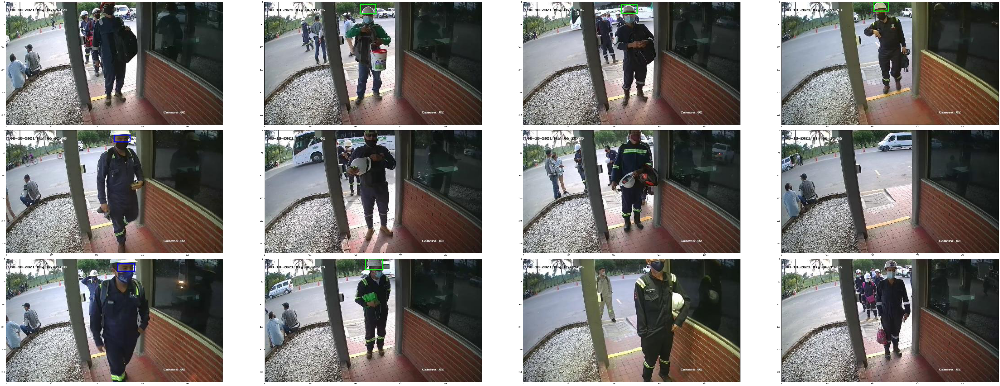

In [27]:
# Visualizing the first 12 images.
OUTPUT_PATH = 'tlt_infer_testing/images_annotated' # relative path from $USER_EXPERIMENT_DIR.
COLS = 4 # number of columns in the visualizer grid.
IMAGES = 12 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)

## 9. Deploy! <a class="anchor" id="head-9"></a>

In [28]:
# Convertirlo en algo que pueda ejecutarse en la Jetson
# Esta es la carpeta que tiene que pasarse a la Jetson
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_final
# Removing a pre-existing copy of the etlt if there has been any.
import os
output_file=os.path.join(os.environ['USER_EXPERIMENT_DIR'],
                         "experiment_dir_final/resnet10_detector.etlt")
if os.path.exists(output_file):
    os.system("rm {}".format(output_file))
!tlt-export detectnet_v2 \
            -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/resnet10_detector_pruned.tlt \
            -o $USER_EXPERIMENT_DIR/experiment_dir_final/resnet10_detector.etlt \
            -k $KEY

Using TensorFlow backend.
2021-09-13 03:38:39.670957: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 03:38:43.898953: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-09-13 03:38:43.899206: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-13 03:38:43.900016: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:04.0
2021-09-13 03:38:43.900062: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 03:38:43.900141: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully ope

2021-09-13 03:38:51.326234: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-13 03:38:51.327052: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:04.0
2021-09-13 03:38:51.327132: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 03:38:51.327201: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2021-09-13 03:38:51.327245: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2021-09-13 03:38:51.327277: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library li

In [29]:
print('Exported model:')
print('------------')
!ls -lh $USER_EXPERIMENT_DIR/experiment_dir_final

Exported model:
------------
total 1.3M
-rw-r--r-- 1 root root 1.3M Sep 13 03:38 resnet10_detector.etlt


### A. Int8 Optimization <a class="anchor" id="head-9-1"></a>
DetectNet_v2 model supports int8 inference mode in TRT. In order to use int8 mode, we must calibrate the model to run 8-bit inferences. This involves 2 steps

* Generate calibration tensorfile from the training data using tlt-int8-tensorfile
* Use tlt-export to generate int8 calibration table.

*Note: For this example, we generate a calibration tensorfile containing 10 batches of training data.
Ideally, it is best to use atleast 10-20% of the training data to calibrate the model. The more data provided during calibration, the closer int8 inferences are to fp32 inferences.*

*Note: If the model was trained with QAT nodes available, please refrain from using the post training int8 optimization as mentioned below. Please export the model in int8 mode (using the arg `--data_type int8`) with just the path to the calibration cache file (using the argument `--cal_cache_file`)*

In [30]:
# Esto crea, dentro de la carpeta del modelo exportado, un archivo de calibracion
!tlt-int8-tensorfile detectnet_v2 -e $SPECS_DIR/detectnet_v2_retrain_resnet10_kitti.txt \
                                  -m 10 \
                                  -o $USER_EXPERIMENT_DIR/experiment_dir_final/calibration.tensor

Using TensorFlow backend.
2021-09-13 03:41:55.976162: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 03:41:59,966 [INFO] iva.detectnet_v2.spec_handler.spec_loader: Merging specification from /workspace/riesgo-encubierto/specs/detectnet_v2_retrain_resnet10_kitti.txt
Traceback (most recent call last):
  File "/usr/local/bin/tlt-int8-tensorfile", line 8, in <module>
    sys.exit(main())
  File "/home/vpraveen/.cache/dazel/_dazel_vpraveen/715c8bafe7816f3bb6f309cd506049bb/execroot/ai_infra/bazel-out/k8-py3-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/common/magnet_tensorfile.py", line 39, in main
  File "<decorator-gen-2>", line 2, in main
  File "/home/vpraveen/.cache/dazel/_dazel_vpraveen/715c8bafe7816f3bb6f309cd506049bb/execroot/ai_infra/bazel-out/k8-py3-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/utilities/timer.py", line 46, in wrapped_fn
  File 

In [31]:
# Este crea otro archivo de calibración .bin
!rm -rf $USER_EXPERIMENT_DIR/experiment_dir_final/resnet10_detector.etlt
!rm -rf $USER_EXPERIMENT_DIR/experiment_dir_final/calibration.bin
!tlt-export detectnet_v2 \
            -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/resnet10_detector_pruned.tlt \
            -o $USER_EXPERIMENT_DIR/experiment_dir_final/resnet10_detector.etlt \
            -k $KEY  \
            --cal_data_file $USER_EXPERIMENT_DIR/experiment_dir_final/calibration.tensor \
            --data_type int8 \
            --batches 10 \
            --batch_size 4 \
            --max_batch_size 4\
            --engine_file $USER_EXPERIMENT_DIR/experiment_dir_final/resnet10_detector.trt.int8 \
            --cal_cache_file $USER_EXPERIMENT_DIR/experiment_dir_final/calibration.bin \
            --verbose

Using TensorFlow backend.
2021-09-13 03:43:48.269608: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 03:43:52.492654: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-09-13 03:43:52.492918: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-13 03:43:52.493740: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:04.0
2021-09-13 03:43:52.493794: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 03:43:52.493853: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully ope

2021-09-13 03:43:58,285 [DEBUG] modulus.export._uff: Unpatching keras BatchNormalization layer...
2021-09-13 03:43:58,285 [DEBUG] modulus.export._uff: Unpatching keras Dropout layer...
2021-09-13 03:44:00.027879: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-13 03:44:00.028738: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla V100-SXM2-16GB major: 7 minor: 0 memoryClockRate(GHz): 1.53
pciBusID: 0000:00:04.0
2021-09-13 03:44:00.028837: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2021-09-13 03:44:00.028923: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2021-09-13 03:44:00.028987: I tensorflow/stream_executor/platform/default/dso_loader.cc:44

2021-09-13 03:44:28,507 [DEBUG] iva.common.export.base_calibrator: read_calibration_cache - no-op
DEPRECATED: This variant of get_batch is deprecated. Please use the single argument variant described in the documentation instead.
2021-09-13 03:44:44,854 [DEBUG] iva.common.export.base_calibrator: read_calibration_cache - no-op
2021-09-13 03:44:44,854 [INFO] iva.common.export.base_calibrator: Saving calibration cache (size 2608) to /workspace/riesgo-encubierto/detectnet_v2/experiment_dir_final/calibration.bin


### B. Generate TensorRT engine <a class="anchor" id="head-9-2"></a>
Verify engine generation using the `tlt-converter` utility included with the docker.

The `tlt-converter` produces optimized tensorrt engines for the platform that it resides on. Therefore, to get maximum performance, please instantiate this docker and execute the `tlt-converter` command, with the exported `.etlt` file and calibration cache (for int8 mode) on your target device. The converter utility included in this docker only works for x86 devices, with discrete NVIDIA GPU's. 

For the jetson devices, please download the converter for jetson from the dev zone link >C. 

If you choose to integrate your model into deepstream directly, you may do so by simply copying the exported `.etlt` file along with the calibration cache to the target device and updating the spec file that configures the `gst-nvinfer` element to point to this newly exported model. Usually this file is called `config_infer_primary.txt` for detection models and `config_infer_secondary_*.txt` for classification models.

In [ ]:
# Pasar a la Jetson /opt/nvidia/deepstream/deepstream-5.0/samples la carpeta /experiment_dir_final, 
# adentro con el tlt_converter (Version 7)
# Esto Genera un archivo /experiment_dir_final/resnet18_detector.trt dentro de la Jetson
!tlt-converter $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector.etlt \
               -k $KEY \
               -c $USER_EXPERIMENT_DIR/experiment_dir_final/calibration.bin \
               -o output_cov/Sigmoid,output_bbox/BiasAdd \
               -d 3,384,1248 \
               -i nchw \
               -m 64 \
               -t int8 \
               -e $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector.trt \
               -b 4

## 10. Verify Deployed Model <a class="anchor" id="head-10"></a>
Verify the exported model by visualizing inferences on TensorRT.
In addition to running inference on a `.tlt` model in [step 8](#head-8), the `tlt-infer` tool is also capable of consuming the converted `TensorRT engine` from [step 9.B](#head-9-2).

*If after int-8 calibration the accuracy of the int-8 inferences seem to degrade, it could be because the there wasn't enough data in the calibration tensorfile used to calibrate thee model or, the training data is not entirely representative of your test images, and the calibration maybe incorrect. Therefore, you may either regenerate the calibration tensorfile with more batches of the training data, and recalibrate the model, or calibrate the model on a few images from the test set. This may be done using `--cal_image_dir` flag in the `tlt-export` tool. For more information, please follow the instructions in the USER GUIDE.

### A. Inference using TensorRT engine <a class="anchor" id="head-10-1"></a>

In [1]:
!tlt-infer detectnet_v2 -e $SPECS_DIR/detectnet_v2_inference_kitti_etlt.txt \
                        -o $USER_EXPERIMENT_DIR/etlt_infer_testing \
                        -i $DATA_DOWNLOAD_DIR/testing/image_2 \
                        -k $KEY

"tlt-infer" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.


In [ ]:
# visualize the first 12 inferenced images.
OUTPUT_PATH = 'etlt_infer_testing/images_annotated' # relative path from $USER_EXPERIMENT_DIR.
COLS = 4 # number of columns in the visualizer grid.
IMAGES = 12 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)

Eso fue para ejecutarlo sobre imágenes y vaidar.
Para validar sobre un video completo se usa la aplicación de deepstream: deepstream-app
> Dentro de /opt/nvidia/deepstream/deepstream-5.0/samples/configs/deepstream-app

In [ ]:
# Para validar primero el modelo base que existe en la jetson
!deepstream-app -c source8_1080p_dec_infer-resnet_tracker_tiled_display_fp16_tx1.txt

Para después probar el mío, mover el nuevo archivo /experiment_dir_final/resnet18_detector.trt a la carpeta ../models/Primary_Detector *(Guardar en otra carpeta lo que está ahí para que no se confunda)*  
Necesita también un labels.txt:
> car  
> cyclist  
> pedestrian  

Y modificar el models/config_infer_primary.txt:
- model_engine_file=resnet10_detector.trt # El archivo nuevo
- model_prototxt y model_: Se pueden borrar en este caso (Ya no es caffe)
- batch size baja de 30 a 8 (Nano estaba en 8)
- network_mode=1 # int8, así estaba...
- num_detected_classes=3

Modificar el que estamos ejecutando: deepstream-app/source8_1080p_dec_infer-resnet_tracker_tiled_display_fp16_tx1.txt
- [streammux] batchsize=4 #(Estaba en 8)
- [primary-gie] model_engine_file=resnet10_detector.trt # El archivo nuevo
- [primary-gie] batchsize=4 #(Estaba en 8)
- [primary-gie] config_file = config_infer_primary.txt # Estaba el nano

Y se vuelve a ejecutar con el mismo comando

## 11. QAT workflow <a class="anchor" id="head-11"></a>
This section delves into the newly enabled Quantization Aware Training feature with DetectNet_v2. The workflow defined below converts a pruned model from section [5](#head-5). 

### A. Convert pruned model to QAT and retrain <a class="anchor" id="head-11-1"></a>
All detectnet models, unpruned and pruned models can be converted to QAT models by setting the `enable_qat` parameter in the `training_config` component of the spec file to `true`.

In [ ]:
# Printing the retrain experiment file. 
# Note: We have updated the experiment file to convert the
# pretrained model to qat mode by setting the enable_qat
# parameter.
!cat $SPECS_DIR/detectnet_v2_retrain_resnet18_kitti_qat.txt

In [ ]:
!tlt-train detectnet_v2 -e $SPECS_DIR/detectnet_v2_retrain_resnet18_kitti_qat.txt \
                        -r $USER_EXPERIMENT_DIR/experiment_dir_retrain_qat \
                        -k $KEY \
                        -n resnet18_detector_pruned_qat \
                        --gpus $NUM_GPUS

In [ ]:
!ls -rlt $USER_EXPERIMENT_DIR/experiment_dir_retrain_qat/weights

### B. Evaluate QAT converted model <a class="anchor" id="head-11-2"></a>
This section evaluates a QAT enabled pruned retrained model. The mAP of this model should be comparable to that of the pruned retrained model without QAT. However, due to quantization, it is possible sometimes to see a drop in the mAP value for certain datasets.

In [ ]:
!tlt-evaluate detectnet_v2 -e $SPECS_DIR/detectnet_v2_retrain_resnet18_kitti_qat.txt \
                           -m $USER_EXPERIMENT_DIR/experiment_dir_retrain_qat/weights/resnet18_detector_pruned_qat.tlt \
                           -k $KEY \
                           -f tlt

### C. Export QAT trained model to int8 <a class="anchor" id="head-11-3"></a>
Export a QAT trained model to TensorRT parsable model. This command generates an .etlt file from the trained model and the serializes corresponding int8 scales as a TRT readable calibration cache file.

In [ ]:
!rm -rf $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector_qat.etlt
!rm -rf $USER_EXPERIMENT_DIR/experiment_dir_final/calibration_qat.bin
!tlt-export detectnet_v2 -m $USER_EXPERIMENT_DIR/experiment_dir_retrain_qat/weights/resnet18_detector_pruned_qat.tlt \
            -o $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector_qat.etlt \
            -k $KEY  \
            --data_type int8 \
            --batch_size 64 \
            --max_batch_size 64\
            --engine_file $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector_qat.trt.int8 \
            --cal_cache_file $USER_EXPERIMENT_DIR/experiment_dir_final/calibration_qat.bin \
            --verbose

### D. Evaluate a QAT trained model using the exported TensorRT engine <a class="anchor" id="head-11-4"></a>
This section evaluates a QAT enabled pruned retrained model using the TensorRT int8 engine that was exported in [Section C](#head-11-3). Please note that there maybe a slight difference (~0.1-0.5%) in the mAP from [Section B](#head-11-2), oweing to some differences in the implementation of quantization in TensorRT.

*Note: The TRT evaluator might be slightly slower than the TLT evaluator here, because the evaluation dataloader is pinned to the CPU to avoid any clashes between TRT and TLT instances in the GPU. Please note that this tool was not intended and has not been developed for profiling the model. It is just a means to qualitatively analyse the model.*

*Please use native TensorRT or DeepStream for the most optimized inferences.*

In [ ]:
!tlt-evaluate detectnet_v2 -e $SPECS_DIR/detectnet_v2_retrain_resnet18_kitti_qat.txt \
                           -m $USER_EXPERIMENT_DIR/experiment_dir_final/resnet18_detector_qat.trt.int8 \
                           -f tensorrt

### D. Inference using QAT engine <a class="anchor" id="head-11-5"></a>
Run inference and visualize detections on test images, using the exported TensorRT engine from [Section C](#head-11-3).

In [ ]:
!tlt-infer detectnet_v2 -e $SPECS_DIR/detectnet_v2_inference_kitti_etlt_qat.txt \
                        -o $USER_EXPERIMENT_DIR/tlt_infer_testing_qat \
                        -i $DATA_DOWNLOAD_DIR/testing/image_2 \
                        -k $KEY

In [ ]:
# visualize the first 12 inferenced images.
OUTPUT_PATH = 'tlt_infer_testing_qat/images_annotated' # relative path from $USER_EXPERIMENT_DIR.
COLS = 4 # number of columns in the visualizer grid.
IMAGES = 12 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)